In [3]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
dataset_src = "parkinsons_updrs.csv"
df = pd.read_csv(dataset_src)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject#       5875 non-null   int64  
 1   age            5875 non-null   int64  
 2   sex            5875 non-null   int64  
 3   test_time      5875 non-null   float64
 4   motor_UPDRS    5875 non-null   float64
 5   total_UPDRS    5875 non-null   float64
 6   Jitter(%)      5875 non-null   float64
 7   Jitter(Abs)    5875 non-null   float64
 8   Jitter:RAP     5875 non-null   float64
 9   Jitter:PPQ5    5875 non-null   float64
 10  Jitter:DDP     5875 non-null   float64
 11  Shimmer        5875 non-null   float64
 12  Shimmer(dB)    5875 non-null   float64
 13  Shimmer:APQ3   5875 non-null   float64
 14  Shimmer:APQ5   5875 non-null   float64
 15  Shimmer:APQ11  5875 non-null   float64
 16  Shimmer:DDA    5875 non-null   float64
 17  NHR            5875 non-null   float64
 18  HNR     

In [7]:
df.describe()

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,...,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,21.494128,64.804936,0.317787,92.863722,21.296229,29.018942,0.006154,0.000044,0.002987,0.003277,...,0.310960,0.017156,0.020144,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589
std,12.372279,8.821524,0.465656,53.445602,8.129282,10.700283,0.005624,0.000036,0.003124,0.003732,...,0.230254,0.013237,0.016664,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498
min,1.000000,36.000000,0.000000,-4.262500,5.037700,7.000000,0.000830,0.000002,0.000330,0.000430,...,0.026000,0.001610,0.001940,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983
25%,10.000000,58.000000,0.000000,46.847500,15.000000,21.371000,0.003580,0.000022,0.001580,0.001820,...,0.175000,0.009280,0.010790,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340
50%,22.000000,65.000000,0.000000,91.523000,20.871000,27.576000,0.004900,0.000035,0.002250,0.002490,...,0.253000,0.013700,0.015940,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500
75%,33.000000,72.000000,1.000000,138.445000,27.596500,36.399000,0.006800,0.000053,0.003290,0.003460,...,0.365000,0.020575,0.023755,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490
max,42.000000,85.000000,1.000000,215.490000,39.511000,54.992000,0.099990,0.000446,0.057540,0.069560,...,2.107000,0.162670,0.167020,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730


In [9]:
df.isnull().sum()

subject#         0
age              0
sex              0
test_time        0
motor_UPDRS      0
total_UPDRS      0
Jitter(%)        0
Jitter(Abs)      0
Jitter:RAP       0
Jitter:PPQ5      0
Jitter:DDP       0
Shimmer          0
Shimmer(dB)      0
Shimmer:APQ3     0
Shimmer:APQ5     0
Shimmer:APQ11    0
Shimmer:DDA      0
NHR              0
HNR              0
RPDE             0
DFA              0
PPE              0
dtype: int64

In [10]:
df.nunique()

subject#           42
age                23
sex                 2
test_time        2442
motor_UPDRS      1080
total_UPDRS      1129
Jitter(%)        1305
Jitter(Abs)      4105
Jitter:RAP        853
Jitter:PPQ5       840
Jitter:DDP       1703
Shimmer          3581
Shimmer(dB)       852
Shimmer:APQ3     2664
Shimmer:APQ5     2850
Shimmer:APQ11    3283
Shimmer:DDA      4223
NHR              5532
HNR              4780
RPDE             5430
DFA              5282
PPE              4777
dtype: int64

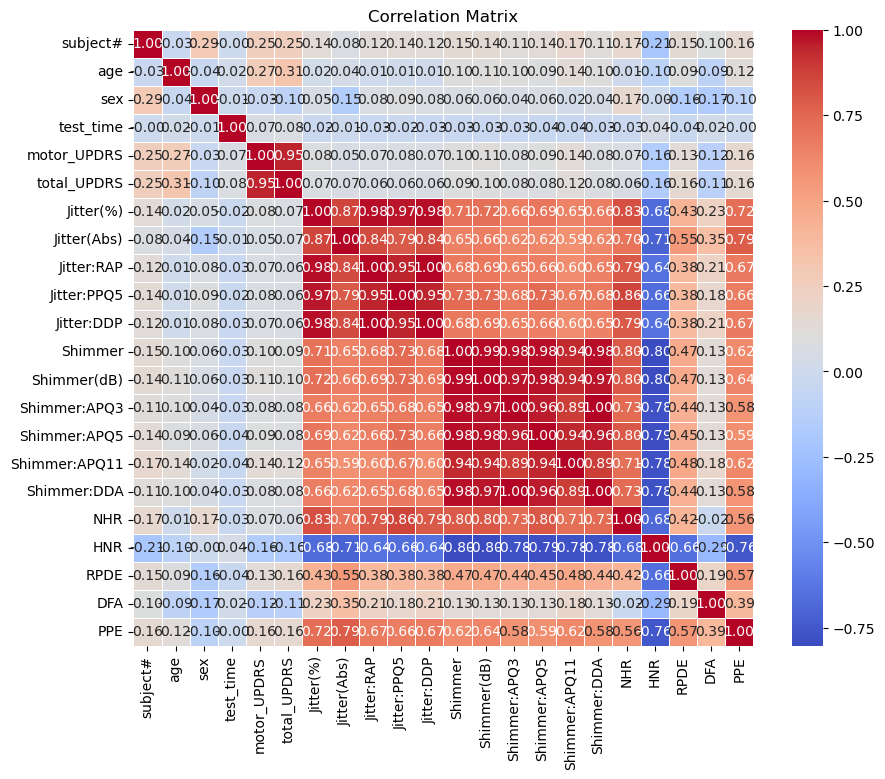

In [12]:
correlation_matrix = df.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

/tmp/ipykernel_556/341582106.py:15: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


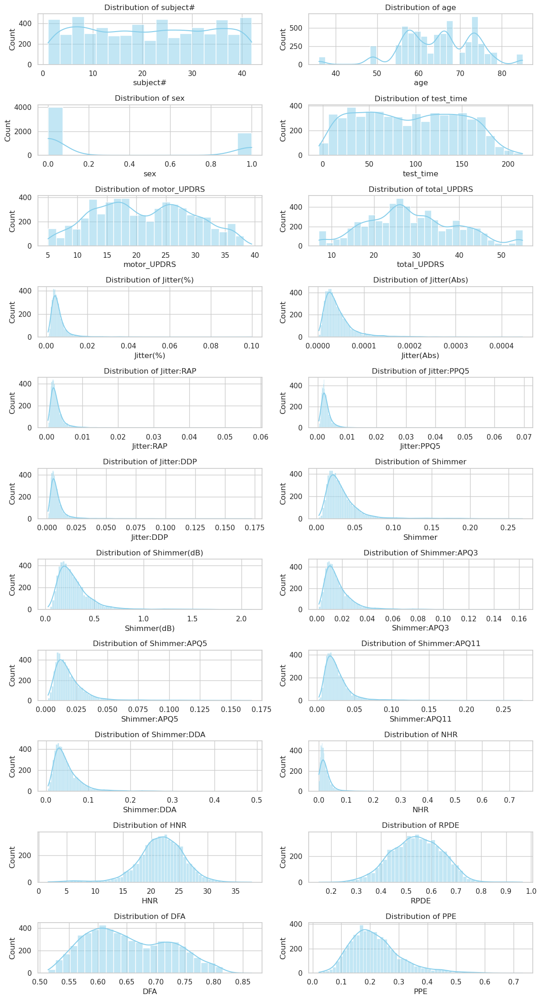

In [14]:
sns.set(style="whitegrid")

# Set up the subplots
fig, axes = plt.subplots(nrows=len(df.columns)//2, ncols=2, figsize=(12, 2*len(df.columns)//2), constrained_layout=True)

# Flatten the axes for easier iteration
axes = axes.flatten()

# Loop through each numerical column and plot the distribution
for i, column in enumerate(df.select_dtypes(include=['float64', 'int64']).columns):
    sns.histplot(df[column], kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Distribution of {column}')

# Adjust layout
plt.tight_layout()
plt.show()

In [16]:
for column in df.select_dtypes(include=['float64', 'int64']).columns:
    print(f"{column}: Min={df[column].min()}, Max={df[column].max()}")

subject#: Min=1, Max=42
age: Min=36, Max=85
sex: Min=0, Max=1
test_time: Min=-4.2625, Max=215.49
motor_UPDRS: Min=5.0377, Max=39.511
total_UPDRS: Min=7.0, Max=54.992
Jitter(%): Min=0.00083, Max=0.09999
Jitter(Abs): Min=2.25e-06, Max=0.00044559
Jitter:RAP: Min=0.00033, Max=0.05754
Jitter:PPQ5: Min=0.00043, Max=0.06956
Jitter:DDP: Min=0.00098, Max=0.17263
Shimmer: Min=0.00306, Max=0.26863
Shimmer(dB): Min=0.026, Max=2.107
Shimmer:APQ3: Min=0.00161, Max=0.16267
Shimmer:APQ5: Min=0.00194, Max=0.16702
Shimmer:APQ11: Min=0.00249, Max=0.27546
Shimmer:DDA: Min=0.00484, Max=0.48802
NHR: Min=0.000286, Max=0.74826
HNR: Min=1.659, Max=37.875
RPDE: Min=0.15102, Max=0.96608
DFA: Min=0.51404, Max=0.8656
PPE: Min=0.021983, Max=0.73173


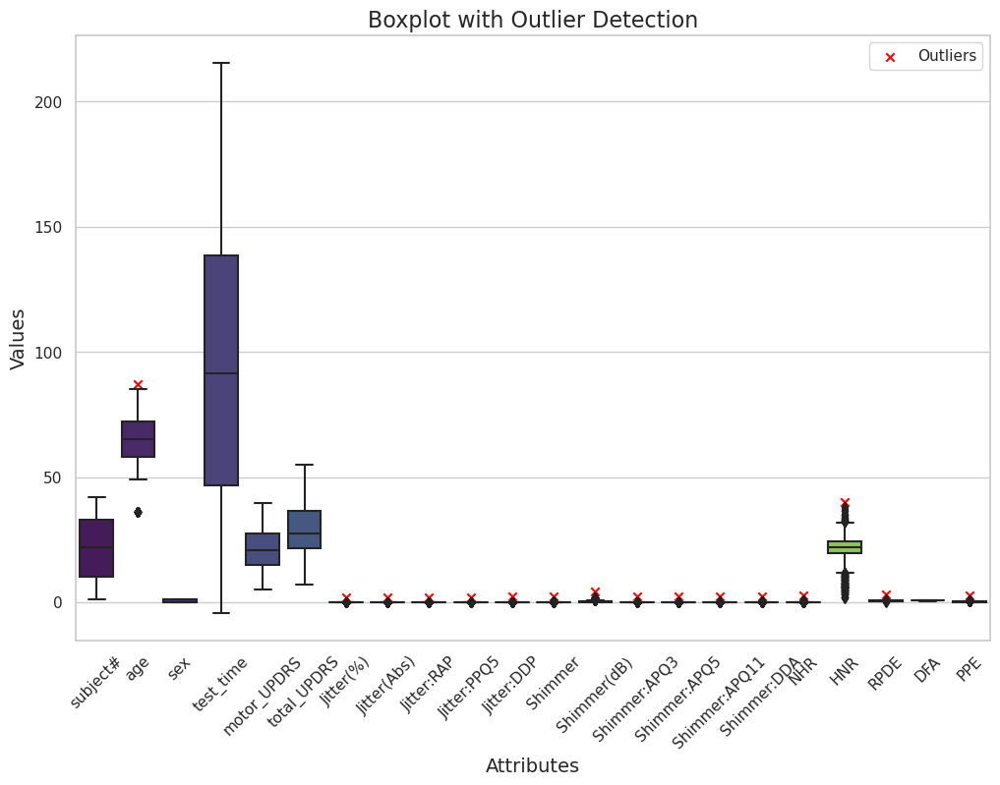

In [20]:
# Outlier detection using IQR
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

df_no_outliers = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

# Beautify the boxplot for outlier detection
plt.figure(figsize=(12, 8))
sns.set(style="whitegrid")
sns.boxplot(data=df, palette='viridis')
plt.title('Boxplot with Outlier Detection', fontsize=16)
plt.xlabel('Attributes', fontsize=14)
plt.ylabel('Values', fontsize=14)

# Highlight the outliers with a different color or style
outlier_mask = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))
outlier_positions = [i for i, is_outlier in enumerate(outlier_mask.any(axis=0)) if is_outlier]
plt.scatter(x=outlier_positions, y=df.iloc[:, outlier_positions].max() + 2, marker='x', color='red', label='Outliers')
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [31]:
print(df.drop_duplicates('subject#')['sex'].value_counts())

0    28
1    14
Name: sex, dtype: int64


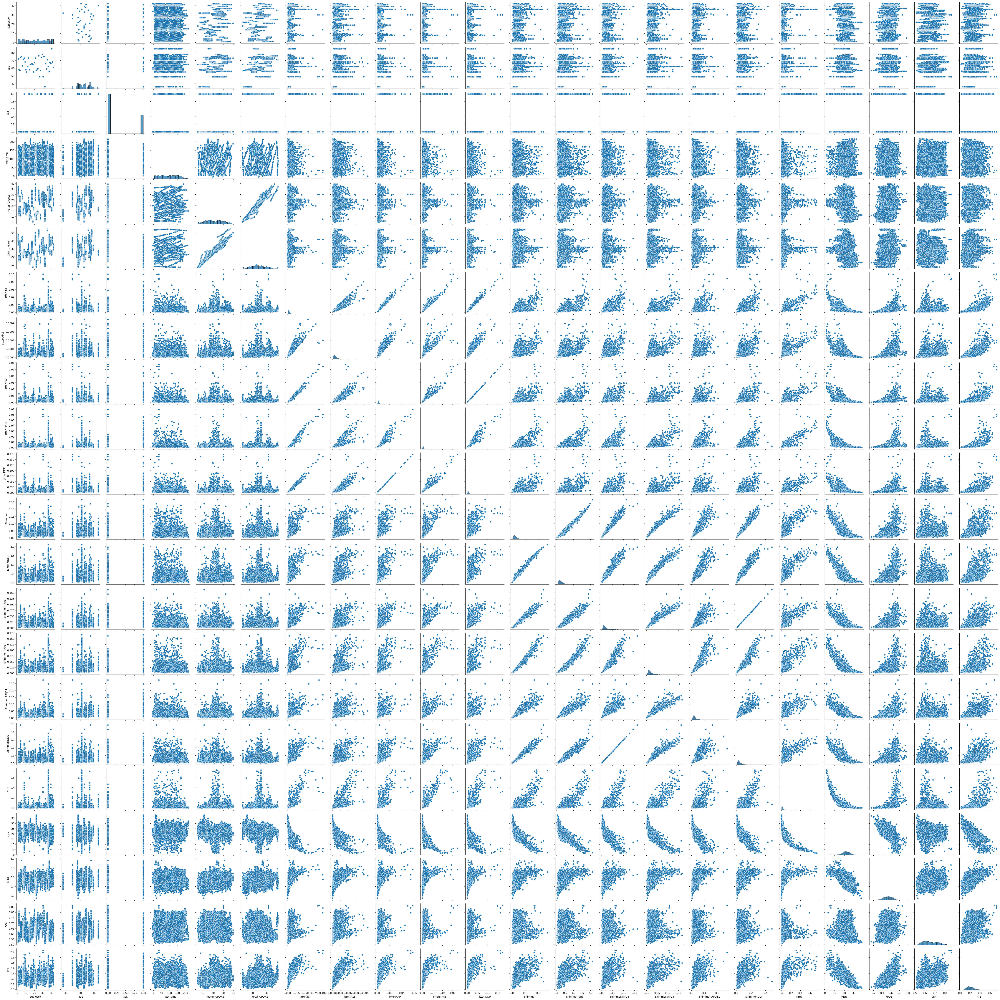

In [6]:
sns.pairplot(df)
plt.show()